Datasets can be downloaded [here](https://www.dropbox.com/sh/2vmlbo7sgf5w26v/AABuNn2MATJ8Tm_mpqPZIcw2a?dl=0)   

Data preparation is illustrated [here](https://nbviewer.jupyter.org/github/pinellolab/STREAM/blob/master/tutorial/prep_nestorowa2016.ipynb) 

Ref: Nestorowa, S. et al. A single-cell resolution map of mouse hematopoietic stem and progenitor cell differentiation. Blood 128, e20-31 (2016).

In [2]:
import stream as st
st.__version__

'1.0'

In [3]:
st.set_figure_params(dpi=80,style='white',figsize=[5.4,4.8],
                     rc={'image.cmap': 'viridis'})

#### Read in data

In [4]:
adata=st.read(file_name='./data_nestorowa2016.tsv.gz',workdir='./stream_result')

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Saving results in: ./stream_result


> **To load and use 10x Genomics single cell RNA-seq data processed with Cell Ranger:**   
(*The variable index can be reset by choosing a different column in `gene.tsv`*)
```python
adata=st.read(file_name='./filtered_gene_bc_matrices/matrix.mtx',
              file_feature='./filtered_gene_bc_matrices/genes.tsv',
              file_sample='./filtered_gene_bc_matrices/barcodes.tsv',
              file_format='mtx',workdir='./stream_result')    
adata.var.index = adata.var[1].values   
```

> **If the Anndata object is already created, to run STREAM, please simply specify work directory:**
```python
st.set_workdir(adata,'./stream_result')
```

In [5]:
adata.var_names_make_unique()

In [6]:
adata

AnnData object with n_obs × n_vars = 1656 × 40594
    uns: 'workdir'

#### Read in metadata

In [7]:
st.add_metadata(adata,file_name='./metadata.tsv')

In [8]:
adata.obs.head()

,label,label_color
HSPC_025,MPP,#eea113
HSPC_031,HSC,#40bdbd
HSPC_037,HSC,#40bdbd
LT-HSC_001,HSC,#40bdbd
HSPC_001,HSC,#40bdbd


> **Alternatively, the step can be divided into two step:**  
(*if `file_name` is not specified, 'unknown' will be genereated for cell label and random color will be used for each label*)
```python
st.add_cell_labels(adata,file_name='./cell_label.tsv.gz')
st.add_cell_colors(adata,file_name='./cell_label_color.tsv.gz')
```

#### Calculate QC

In [9]:
st.cal_qc(adata,assay='rna')

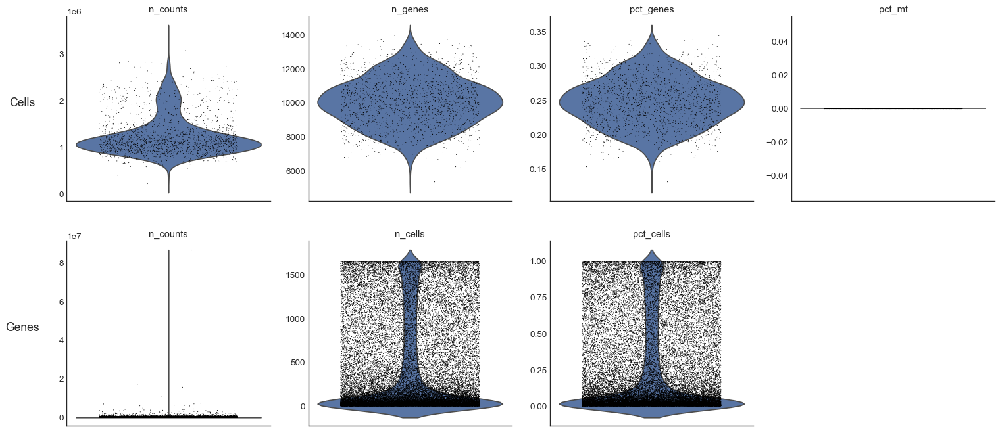

In [10]:
st.plot_qc(adata,jitter=0.3,)

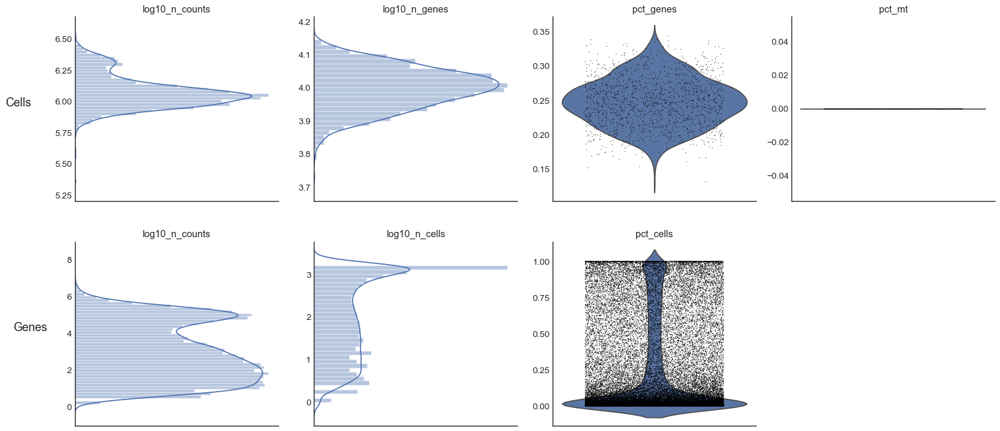

In [11]:
### histogram plots and log-scale are also supported
st.plot_qc(adata,jitter=0.3,log_scale=[0,1,4,5],hist_plot=[0,1,4,5]) 

In [12]:
st.filter_cells(adata,min_n_features= 100)
st.filter_features(adata,min_n_cells = 5)

filter cells based on min_n_features
after filtering out low-quality cells: 
1656 cells, 40594 genes
Filter genes based on min_n_cells
After filtering out low-expressed genes: 
1656 cells, 35077 genes


In [13]:
###Normalize gene expression based on library size  
st.normalize(adata,method='lib_size')
###Logarithmize gene expression 
st.log_transform(adata)
###Remove mitochondrial genes 
st.remove_mt_genes(adata)

#### Feature selection

Please check if the blue curve fits the points well. If not, please adjust the parameter **'loess_frac'** (usually by lowering it) until the blue curve fits well. 

2000 variable genes are selected


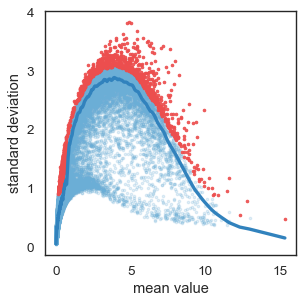

In [14]:
st.select_variable_genes(adata,loess_frac=0.01,n_genes=2000)

using top variable genes ...
40 PCs are selected


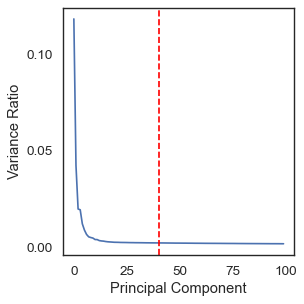

In [15]:
st.select_top_principal_components(adata,feature='var_genes',first_pc=True,n_pc=40)

#### Dimension reduction

In [16]:
st.dimension_reduction(adata,method='se',feature='top_pcs',n_components=4,n_neighbors=15,n_jobs=4)

feature top_pcs is being used ...
4 cpus are being used ...


> **Alternatively, using variable genes as features:**
`st.dimension_reduction(adata,method='se',feature='var_genes',n_neighbors=15, n_components=4)`

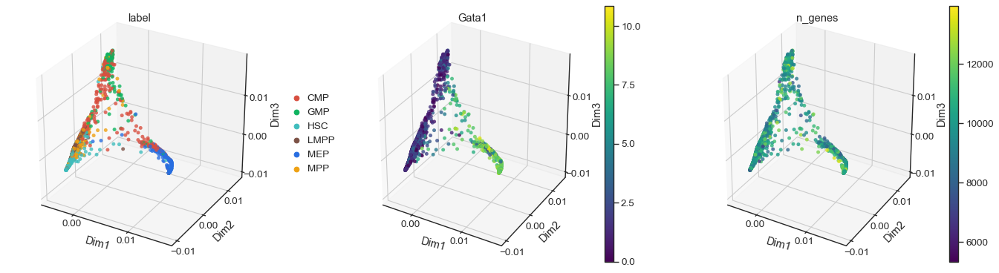

In [17]:
st.plot_dimension_reduction(adata,color=['label','Gata1','n_genes'],
                            show_graph=False,show_text=False)

In [18]:
st.plot_dimension_reduction(adata,color=['label'],
                            show_graph=False,show_text=False,plotly=True)

#### Visualize cells on 2D plane when `n_components>=3` in `st.dimension_reduction()`

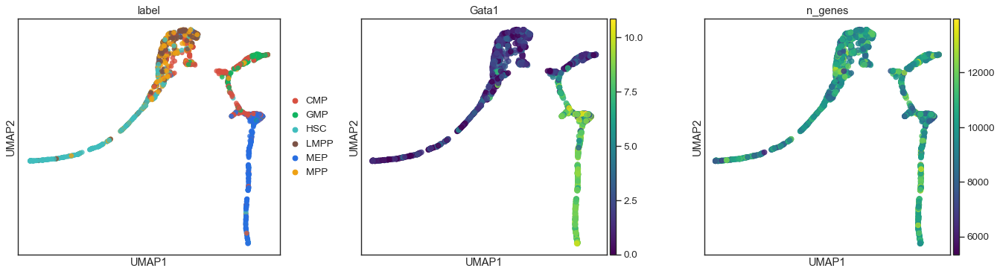

In [19]:
st.plot_visualization_2D(adata,method='umap',n_neighbors=50,
                         color=['label','Gata1','n_genes'],use_precomputed=False)

#### Trajectory inference

* By default, trajectories will be inferred in **the manifold learnt from the step of dimension reduction `st.dimension_reduction()`**


* But it can be also learned directly on **2D visualization plot from `st.plot_visualization_2D()`** by setting `use_vis=True` in st.seed_elastic_principal_graph(). An example can be found [here](https://nbviewer.jupyter.org/github/pinellolab/STREAM/blob/master/tutorial/1.2.use_vis.ipynb)

In [20]:
st.seed_elastic_principal_graph(adata,n_clusters=20)

Seeding initial elastic principal graph...
Clustering...
K-Means clustering ...
The number of initial nodes is 20
Calculatng minimum spanning tree...
Number of initial branches: 5


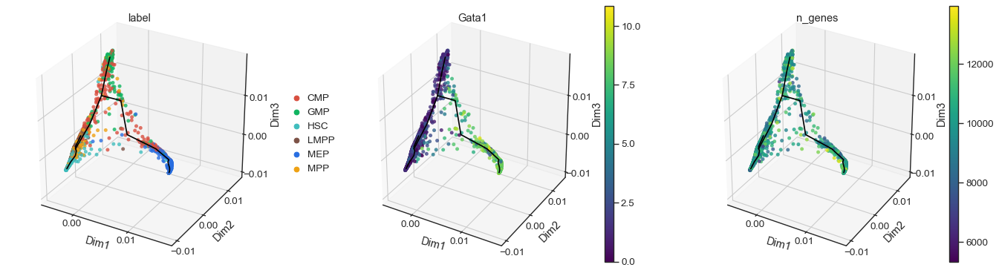

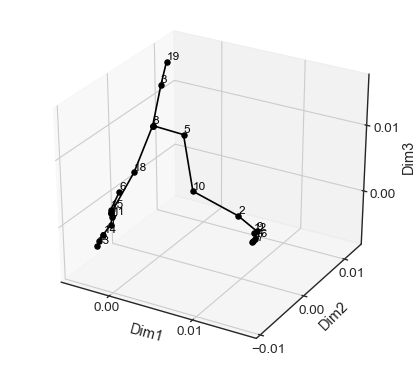

In [21]:
st.plot_dimension_reduction(adata,color=['label','Gata1','n_genes'],n_components=3,show_graph=True,show_text=False)
st.plot_branches(adata,show_text=True)

**`epg_alpha`, `epg_mu`, `epg_lambda` are the three most influential parameters for learning elastic principal graph.**  
- `epg_alpha`: penalizes spurious branching events. **The larger, the fewer branches the function will learn**. (by default, `epg_alpha=0.02`)
- `epg_mu`: penalizes the deviation from harmonic embedding, where harmonicity assumes that each node is the mean of its neighbor nodes. **The larger, the more edges the function will use to fit into points(cells)** (by default, `epg_mu=0.1`) 
- `epg_lambda`: penalizes the total length of edges. **The larger, the 'shorter' curves the function will use to fit into points(cells)** and the fewer points(cells) the curves will reach. (by default, `epg_lambda=0.02`)

> **'epg_trimmingradius'** can help get rid of noisy points (by defalut `epg_trimmingradius=Inf`)   
e.g. `st.elastic_principal_graph(adata,epg_trimmingradius=0.1)`  

In [22]:
st.elastic_principal_graph(adata,epg_alpha=0.02,epg_mu=0.05,epg_lambda=0.01)

epg_n_nodes is too small. It is corrected to the initial number of nodes plus incr_n_nodes
Learning elastic principal graph...
[1]
 "Constructing tree 1 of 1 / Subset 1 of 1"


[1]
 "Computing EPG with 50 nodes on 1656 points and 4 dimensions"


[1]
 "Using a single core"


Nodes = 
20
 
21
 
22
 
23
 
24
 
25
 
26
 
27
 
28
 
29
 
30
 
31
 
32
 
33
 
34
 
35
 
36
 
37
 
38
 
39
 
40
 
41
 
42
 
43
 
44
 
45
 
46
 
47
 
48
 
49
 


BARCODE	ENERGY	NNODES	NEDGES	NRIBS	NSTARS	NRAYS	NRAYS2	MSE	MSEP	FVE	FVEP	UE	UR	URN	URN2	URSD

2||50
	
4.098e-06
	
50
	
49
	
44
	
2
	
0
	
0
	
1.646e-06
	
1.402e-06
	
0.9904
	
0.9918
	
2.123e-06
	
3.295e-07
	
1.647e-05
	
0.0008237
	
0


9.8 sec elapsed

[[1]]



Number of branches after learning elastic principal graph: 5


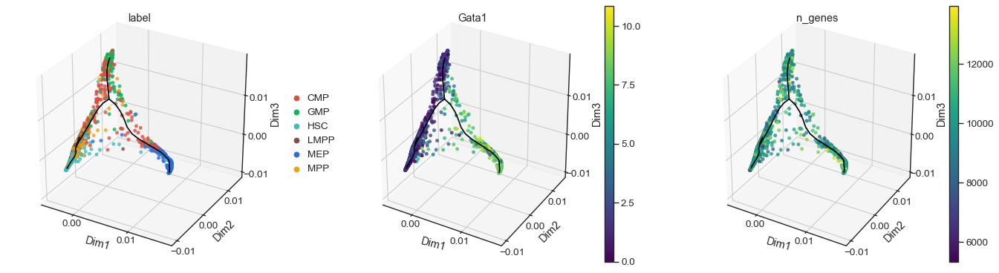

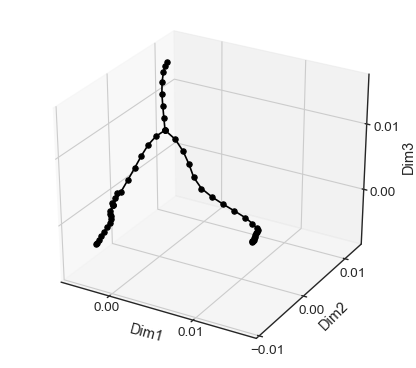

In [23]:
st.plot_dimension_reduction(adata,color=['label','Gata1','n_genes'],n_components=3,show_graph=True,show_text=False)
st.plot_branches(adata,show_text=False)

#### Adjusting trajectories (optional)

* Finetune branching event:  
```python
st.optimize_branching(adata,incr_n_nodes=30)
st.plot_dimension_reduction(adata,show_graph=True,show_text=False)
st.plot_branches(adata,show_text=False)
```
* Prune trivial branches:  
```python
st.prune_elastic_principal_graph(adata,epg_collapse_mode='EdgesNumber',epg_collapse_par=2)
st.plot_dimension_reduction(adata,show_graph=True,show_text=False)
st.plot_branches(adata,show_text=False)
```

* Shift branching node:  
```python
st.shift_branching(adata,epg_shift_mode='NodeDensity',epg_shift_radius=0.1,epg_shift_max=3)
st.plot_dimension_reduction(adata,show_graph=True,show_text=False)
st.plot_branches(adata,show_text=False)
```

Extending leaves with additional nodes ...
Number of branches after extending leaves: 5


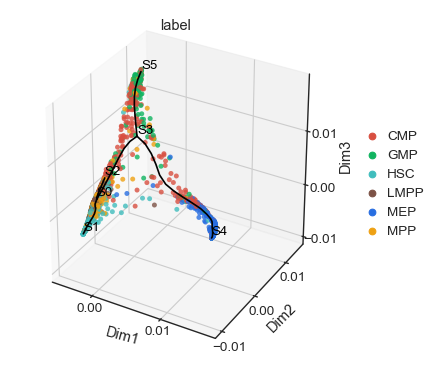

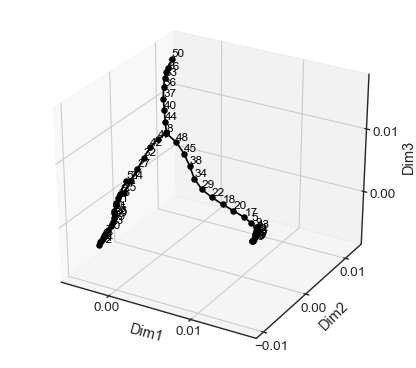

In [24]:
###Extend leaf branch to reach further cells 
st.extend_elastic_principal_graph(adata, epg_ext_mode='WeigthedCentroid',epg_ext_par=0.8)
st.plot_dimension_reduction(adata,color=['label'],n_components=3,show_graph=True,show_text=True)
st.plot_branches(adata,show_text=True)

In [25]:
st.plot_dimension_reduction(adata,color=['label'],n_components=3,show_graph=True,show_text=True,plotly=True)

Importing precomputed umap visualization ...


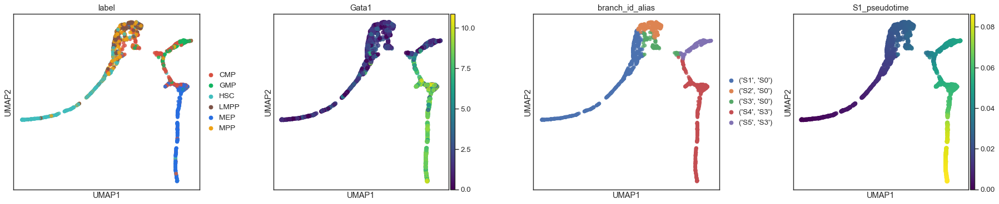

In [26]:
st.plot_visualization_2D(adata,n_neighbors=50,color=['label','Gata1','branch_id_alias','S1_pseudotime'],fig_ncol=4)

#### Trajectory visualization

##### flat tree

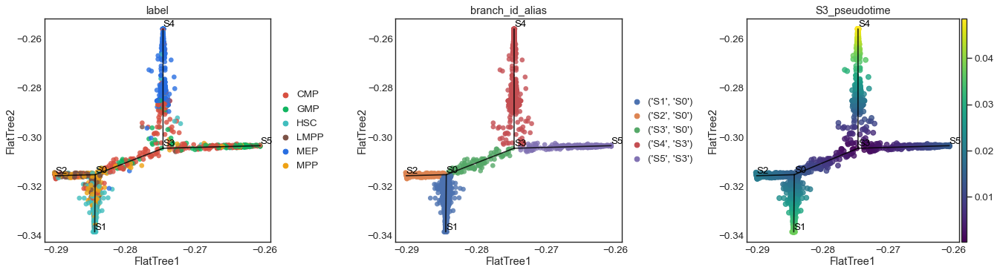

In [27]:
st.plot_flat_tree(adata,color=['label','branch_id_alias','S3_pseudotime'],
                  dist_scale=0.5,show_graph=True,show_text=True)

##### stream plot at single cell level

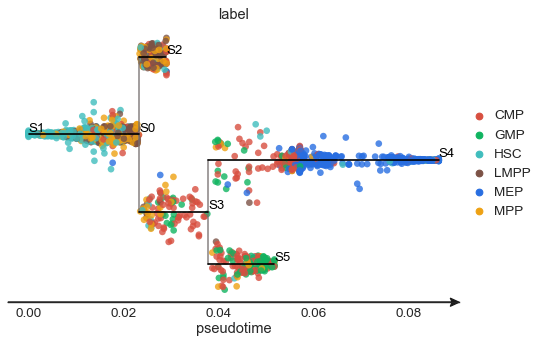

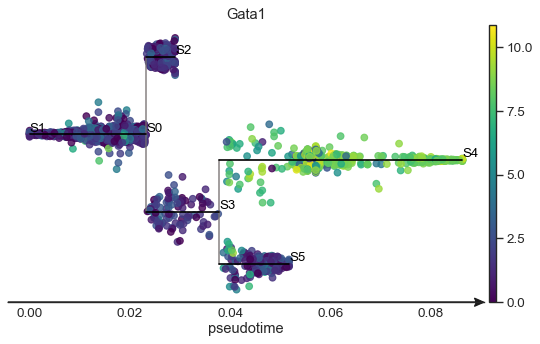

In [28]:
st.plot_stream_sc(adata,root='S1',color=['label','Gata1'],
                  dist_scale=0.3,show_graph=True,show_text=True)

##### stream plots

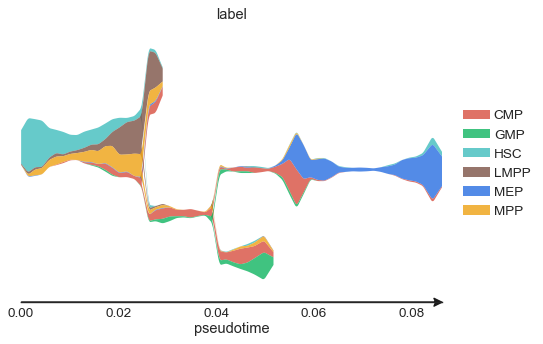

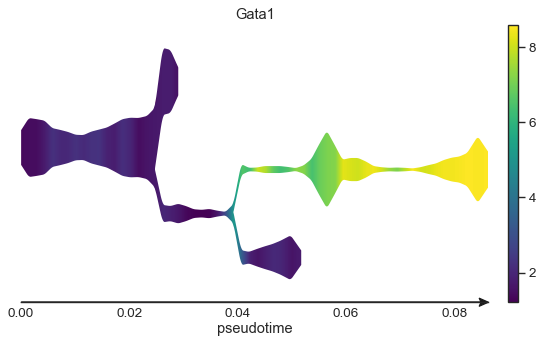

In [29]:
st.plot_stream(adata,root='S1',color=['label','Gata1'])

**Some useful parameters to finetune the appearance of stream plots:**
* `dist_scale`: controls the width of STREAM plot branches.
* `factor_num_win`: controls the resolution of STREAM plot.
* `preference`: controls the order of branches
* `log_scale`: shows stream plot in log scale to zoom in on thin branches

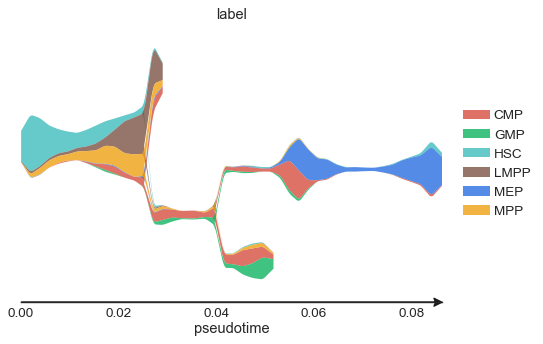

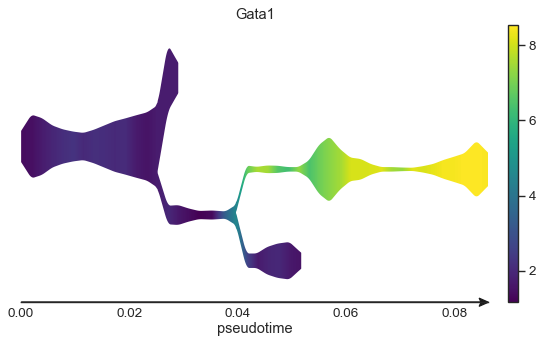

In [30]:
st.plot_stream(adata,root='S1',color=['label','Gata1'],factor_min_win=1.5)

#### Marker genes detection

`marker_list` defines the list of genes to scan. If not specified, by default it uses all available genes. It might be time-consuming.  

Here we only include variable genes.

##### 1) detect marker genes for each leaf branch

In [31]:
st.detect_leaf_markers(adata,marker_list=adata.uns['var_genes'],cutoff_zscore=1.0,cutoff_pvalue=0.01,
                       root='S1',n_jobs=4)

Scanning the specified marker list ...
Filtering out markers that are expressed in less than 5 cells ...
4 cpus are being used ...
2000 markers are being scanned ...


In [32]:
adata.uns['leaf_markers_all'].head()

,zscore,H_statistic,H_pvalue,S1S0_pvalue,S0S2_pvalue,S3S4_pvalue,S3S5_pvalue
Mfsd2b,1.73119,971.544,2.67993e-210,4.68512e-285,4.13815e-201,1,4.26616e-173
Lsp1,1.06338,956.052,6.14683e-207,1.80664e-07,1,9.15373e-218,9.25667e-82
Hlf,1.53252,954.588,1.27707e-206,1,7.12118e-66,3.88563e-302,6.15962e-156
Ly6a,1.21555,947.545,4.30465e-205,1,3.70154e-13,8.96542e-295,9.74348e-130
Gimap6,1.10812,932.144,9.43503e-202,1,6.85413e-06,6.85064e-262,1.02479e-165


In [33]:
adata.uns['leaf_markers'][('S3','S5')].head()

,zscore,H_statistic,H_pvalue,S1S0_pvalue,S0S2_pvalue,S3S4_pvalue,S3S5_pvalue
Prtn3,1.44966,846.577,3.42291e-183,5.93466e-77,3.63307e-87,7.50851e-240,1
Plac8,1.32103,597.985,2.756e-129,7.65062e-132,8.06652e-22,1.69166e-122,1
Tyrobp,1.49571,570.233,2.8593e-123,2.6061e-104,7.59096e-25,2.56518e-136,1
Mpo,1.68458,528.694,2.88406e-114,1.23585e-110,1.42819e-38,1.30874e-128,1
Plppr3,1.10207,525.493,1.42456e-113,6.02785e-16,4.93673e-06,2.60273e-99,1


##### 2) detect transition genes for each branch

In [34]:
st.detect_transition_markers(adata,marker_list=adata.uns['var_genes'],cutoff_spearman=0.4,cutoff_logfc=0.25,
                             root='S1',n_jobs=4)

Scanning the specified marker list ...
Importing precomputed scaled marker expression matrix ...
2000 markers are being scanned ...


In [35]:
adata.uns['transition_markers'][('S3','S4')].head()

,stat,logfc,pval,qval
Blvrb,0.879042,0.847545,2.370844e-171,3.990131e-168
Tmsb4x,-0.873671,1.644629,1.030916e-166,8.675159e-164
Fxyd5,-0.872509,2.515321,9.747882e-166,5.468562e-163
Car2,0.856566,0.432449,3.010774e-153,1.266783e-150
Coro1a,-0.843045,2.242194,8.708529e-144,2.931291e-141


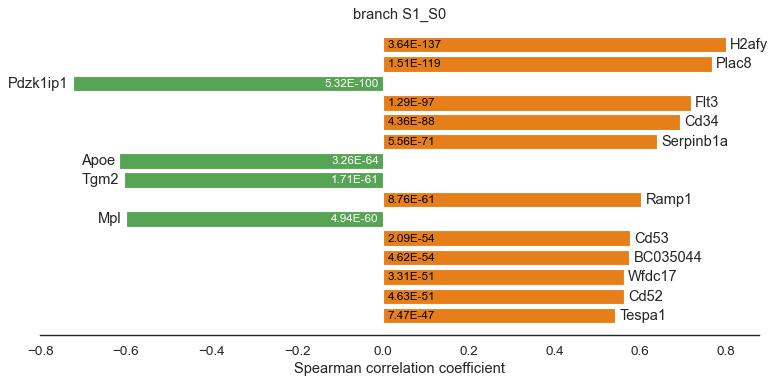

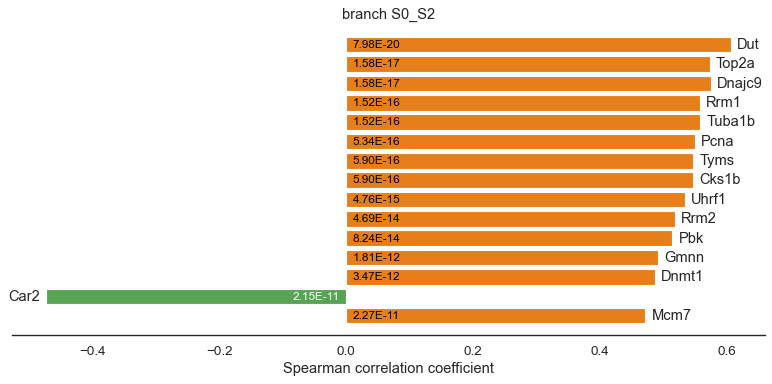

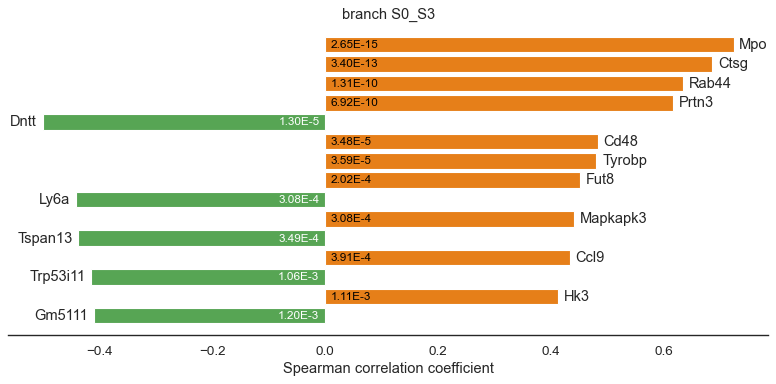

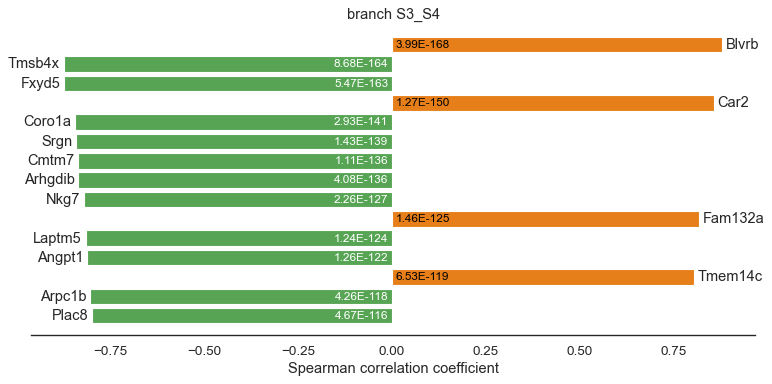

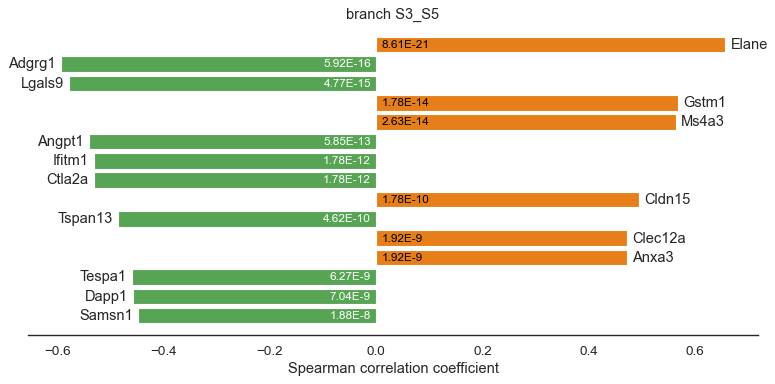

In [36]:
st.plot_transition_markers(adata,fig_size=(10,5))

##### 3) detect marker genes that are differentially expressed between pairs of branches

In [37]:
st.detect_de_markers(adata,marker_list=adata.uns['var_genes'],cutoff_zscore=1,cutoff_logfc=0.25,
                     root='S1',n_jobs=4)

Scanning the specified marker list ...
Importing precomputed scaled marker expression matrix ...
2000 markers are being scanned ...


In [38]:
adata.uns['de_markers_greater'][(('S3', 'S4'), ('S3', 'S5'))].head()

,z_score,U,logfc,mean_up,mean_down,pval,qval
Mfsd2b,19.506093,94986.0,1.823374,0.832106,0.234522,9.785071e-85,6.766377e-82
Car2,19.309515,94512.0,0.912388,0.866174,0.459796,4.485631e-83,1.240726e-80
Vamp5,18.935553,93616.0,0.862626,0.887242,0.487540,5.833307e-80,7.334057e-78
Gata1,18.474235,92522.5,1.944163,0.836230,0.216688,3.342041e-76,3.081362e-74
Slc14a1,18.233632,91954.0,1.694230,0.795594,0.245304,2.802189e-74,2.039698e-72


In [39]:
adata.uns['de_markers_less'][(('S3', 'S4'), ('S3', 'S5'))].head()

,z_score,U,logfc,mean_up,mean_down,pval,qval
Prtn3,-19.557227,1522.0,1.582582,0.312801,0.938732,3.594974e-85,4.971850e-82
Hk3,-19.437617,2153.0,2.936483,0.110801,0.853920,3.725267e-84,1.717348e-81
Tyrobp,-19.414812,1899.5,2.345545,0.176271,0.899578,5.808346e-84,2.008236e-81
Ctsg,-19.270820,2203.0,1.790200,0.270971,0.939501,9.480967e-83,2.185363e-80
Mpo,-19.232438,2299.0,1.286169,0.389208,0.950567,1.988930e-82,3.929558e-80


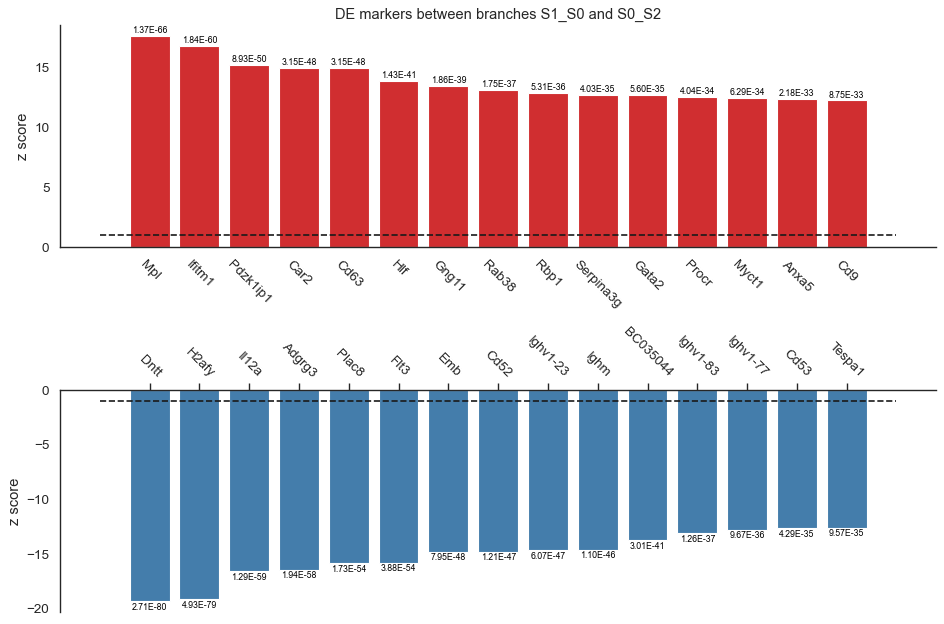

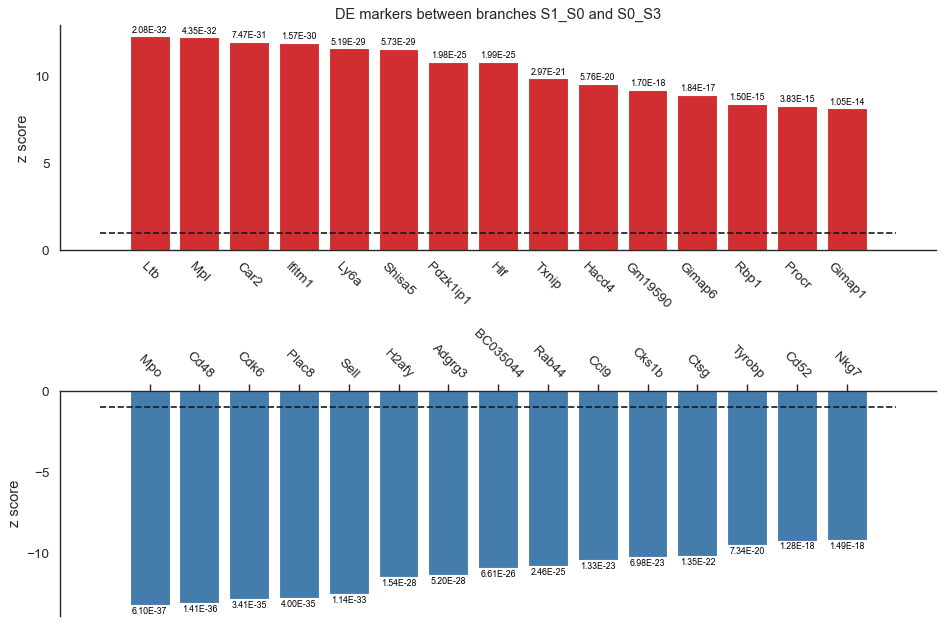

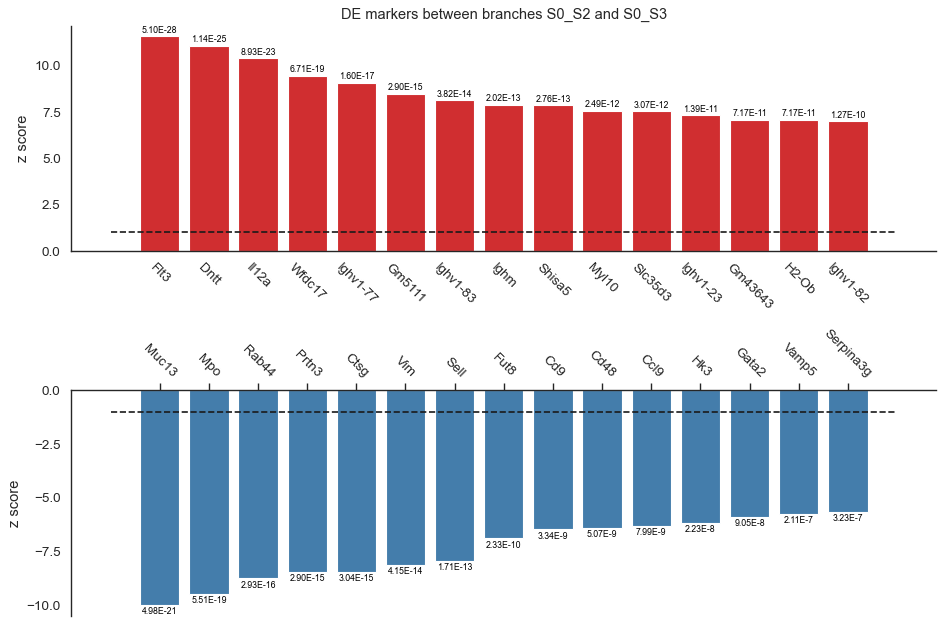

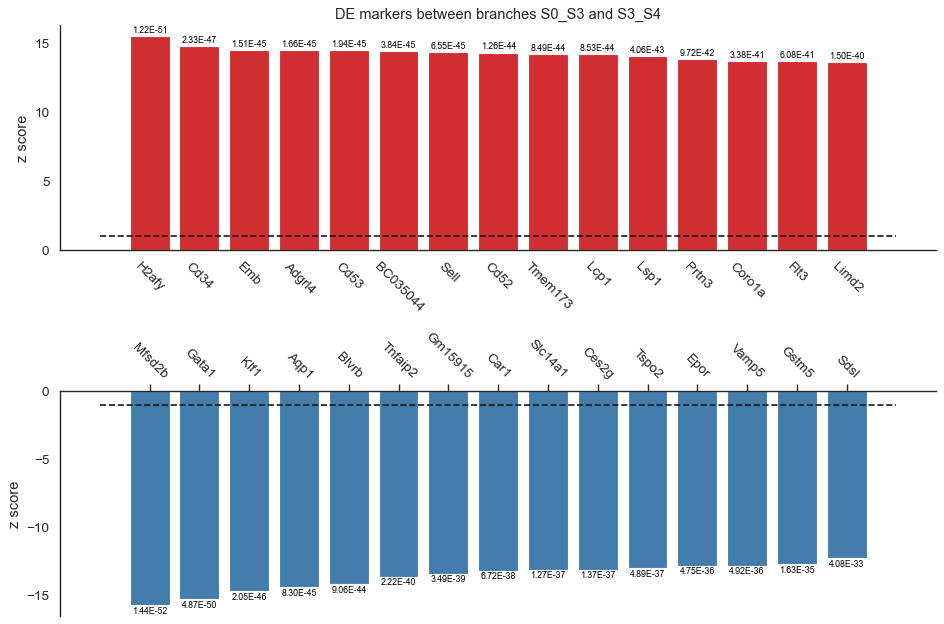

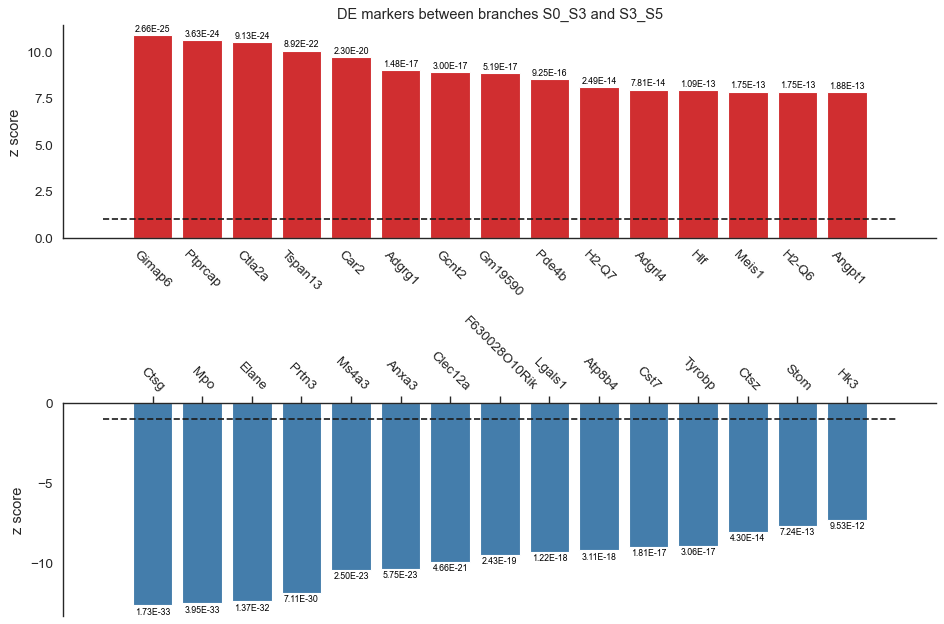

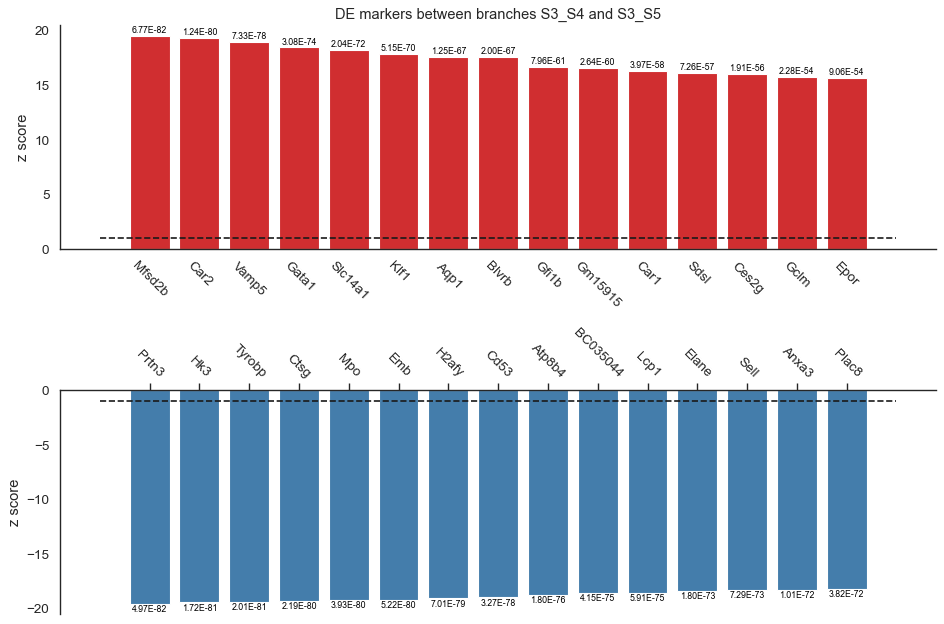

In [40]:
st.plot_de_markers(adata)

##### 4) detect cell population-specific markers

```python
st.detect_markers(adata,ident='label',marker_list=adata.uns['var_genes'],cutoff_zscore=1.0,cutoff_pvalue=0.01)
```

#### Save results

In [41]:
st.write(adata,file_name='stream_result.pkl')

To read back the saved `.pkl` file
```python
adata = st.read('./stream_result/stream_result.pkl')
```

##### Additionally, STREAM analysis result can be also saved
* for single cell VR website (http://singlecellvr.com/)
```python
st.save_vr_report(adata,ann_list=['label','S1_pseudotime'],gene_list=['Gata1','Epx','Car2'])
```
* for STREAM website (http://stream.pinellolab.org/)
```python
st.save_web_report(adata,n_genes=5,
                    title='Nestorowa, S. et al. 2016',
                    description='This scRNA-seq dataset contains 1656 cells and 4768 genes from mouse hematopoietic stem and progenitor cell differentiation. A single-cell resolution map of mouse hematopoietic stem and progenitor cell differentiation. Blood 128, e20-31 (2016).',
                    starting_node='S1',command_used='1.2.STREAM_scRNA-seq (Multifurcation)')
```